In [1]:
import matplotlib.pyplot as plt
import supy as sp
import pandas as pd
import numpy as np
from pathlib import Path
import seaborn as sns 
import datetime
import holoviews as hv
import hvplot.pandas 
from sklearn.metrics import mean_absolute_error
from statsmodels.nonparametric.smoothers_lowess import lowess as  sm_lowess
from scipy.stats import linregress

# Wisley Data
path_runcontrol_w = Path('SuPy/src/supy/sample_run')/ 'RunControl_wisley.nml'
df_state_init_w = sp.init_supy(path_runcontrol_w)
grid_w = df_state_init_w.index[0]
df_forcing_w = sp.load_forcing_grid(path_runcontrol_w, 1)
df_output_w, df_state_final_w = sp.run_supy(df_forcing_w, df_state_init_w)



2021-04-14 14:19:28,458 - SuPy - INFO - All cache cleared.
2021-04-14 14:19:30,121 - SuPy - INFO - All cache cleared.
2021-04-14 14:19:32,382 - SuPy - INFO - ====================
2021-04-14 14:19:32,383 - SuPy - INFO - Simulation period:
2021-04-14 14:19:32,383 - SuPy - INFO -   Start: 2010-12-31 23:05:00
2021-04-14 14:19:32,384 - SuPy - INFO -   End: 2013-01-01 00:00:00
2021-04-14 14:19:32,385 - SuPy - INFO - 
2021-04-14 14:19:32,385 - SuPy - INFO - No. of grids: 1
2021-04-14 14:19:32,386 - SuPy - INFO - SuPy is running in serial mode
2021-04-14 14:21:29,549 - SuPy - INFO - Execution time: 117.2 s
2021-04-14 14:21:29,550 - SuPy - INFO - ====================



In [2]:
df_suews = df_output_w.loc[1].SUEWS

df_day_grasstemp_2011 = pd.read_csv('C:\Script\SuPy\wisley_midas\soilt\day_soil_temp2011.csv',sep=',',skiprows=90,usecols= ('ob_end_time', 'min_grss_temp','max_air_temp','min_air_temp'))
df_day_grasstemp_2011=df_day_grasstemp_2011[:-1]
df_day_grasstemp_2011['ob_end_time'] = pd.to_datetime(df_day_grasstemp_2011['ob_end_time'])
df_day_grasstemp_2011=df_day_grasstemp_2011.set_index('ob_end_time')

df_day_grasstemp_2012 = pd.read_csv('C:\Script\SuPy\wisley_midas\soilt\day_soil_temp2012.csv',sep=';',usecols= ('ob_end_time', 'min_grss_temp','max_air_temp','min_air_temp'))
df_day_grasstemp_2012=df_day_grasstemp_2012[:-1]
df_day_grasstemp_2012['ob_end_time'] = pd.to_datetime(df_day_grasstemp_2012['ob_end_time'])
df_day_grasstemp_2012=df_day_grasstemp_2012.set_index('ob_end_time')

df_obs = pd.concat([df_day_grasstemp_2011,df_day_grasstemp_2012])

In [3]:
def r2 (season, x):
    mask = ~np.isnan(season.reset_index()['Tmin_obs']) & ~np.isnan(season.reset_index()[x])
    slope, intercept, r_value, p_value, std_err = linregress(season.reset_index()['Tmin_obs'][mask],season.reset_index()[x][mask])
    r2 = r_value**2
    r2 ="{:.2f}".format(r2)
    return r2

def slope (season,x):
    mask = ~np.isnan(season.reset_index()['Tmin_obs']) & ~np.isnan(season.reset_index()[x])
    slope, intercept, r_value, p_value, std_err = linregress(season.reset_index()['Tmin_obs'][mask],season.reset_index()[x][mask])
    return slope

def intercept (season,x):
    mask = ~np.isnan(season.reset_index()['Tmin_obs']) & ~np.isnan(season.reset_index()[x])
    slope, intercept, r_value, p_value, std_err = linregress(season.reset_index()['Tmin_obs'][mask],season.reset_index()[x][mask])
    return intercept

In [4]:
df_obs = df_obs.loc[~df_obs.index.duplicated(keep='first')]

s = '2011 01 01'
e = '2012 12 31'
pr = pd.period_range(s,e)

df_merge = pd.DataFrame(columns = ['time', 'TsMin_suews','TsMin_suews_h','Tmin_obs', 'TaMean','TaMin','TaMax','daynight'], index = pr)
idx = 1

df_suews['daynight'] = pd.cut(x=df_suews['Kdown'], bins = [-1,10,10000],labels = ['night','day'])

s = pd.date_range('2011 01 01 9:00', '2012 12 31 9:00', freq='24H') 
e = pd.date_range('2011 01 02 9:00', '2012 12 31 9:00', freq='24H')
f = e.format(formatter=lambda x: x.strftime('%Y %m %d'))

for s, e,f in zip(s, e,f):

    df_merge['time'].iloc[idx] = df_suews.loc[s:e,'Tsurf'].idxmin()
    df_merge['TsMin_suews'].iloc[idx] = df_suews.loc[s:e,'Tsurf'].min()
    df_merge['TsMin_suews_h'].iloc[idx] = df_suews.loc[s:e,'Tsurf'].resample('1h').mean().min()
    df_merge['TaMean'].iloc[idx] = df_forcing_w.loc[s:e, 'Tair'].mean()
    df_merge['TaMin'].iloc[idx] = df_forcing_w.loc[s:e, 'Tair'].min()
    df_merge['TaMax'].iloc[idx] = df_forcing_w.loc[s:e, 'Tair'].max()
    df_merge['Tmin_obs'].iloc[idx] = df_obs.loc[f,'min_grss_temp'].min()
    df_merge['daynight'].iloc[idx] = df_suews['daynight'][df_suews.loc[s:e,'Tsurf'].idxmin()]
   
    idx += 1

df_merge['time'] = df_merge['time'].astype('datetime64')
df_merge['TsMin_suews'] = df_merge['TsMin_suews'].astype('float')
df_merge['TsMin_suews_h'] = df_merge['TsMin_suews_h'].astype('float')
df_merge['Tmin_obs'] = df_merge['Tmin_obs'].astype('float')
df_merge['Year'] = df_merge['time'].dt.year
df_merge['Month'] = df_merge['time'].dt.month
df_merge['Day'] = df_merge['time'].dt.day
df_merge['Hour'] = df_merge['time'].dt.hour
df_merge['Minute'] = df_merge['time'].dt.minute

df_merge['Mean_Ta'] = pd.cut(x=df_merge['TaMean'], bins =[-10, -5, 0, 5, 10, 15, 20, 25],labels = ['<-5','-5-0', '0-5','5-10','10-15','15-20','>20'])
df_merge['season'] = pd.cut(x=df_merge['Month'], bins=[0,2,5,8,11,12], labels =['DJF','MAM','JJA','SON','winter2'])
df_merge['season'] = df_merge['season'].astype('object')
df_merge['season'].loc[df_merge['season']=='winter2'] = 'DJF'
df_merge['season_int'] = df_merge['season']
df_merge['season_int'].loc[df_merge['season']=='winter'] = 1
df_merge['season_int'].loc[df_merge['season']=='spring'] = 2
df_merge['season_int'].loc[df_merge['season']=='summer'] = 3
df_merge['season_int'].loc[df_merge['season']=='autumn'] = 4
df_merge['ToD'] = pd.cut(x=df_merge['Hour'], bins = [-1, 6, 12, 18, 22, 24],labels = ['night','morning', 'afternoon','evening','night2'])
df_merge['ToD'] = df_merge['ToD'].astype('object')
df_merge['ToD'].loc[df_merge['ToD'] == 'night2'] ='night'
df_merge['ToD_bin'] = df_merge['ToD']
df_merge['ToD_bin'].loc[df_merge['ToD']=='night'] = 1
df_merge['ToD_bin'].loc[df_merge['ToD']=='morning'] = 2
df_merge['ToD_bin'].loc[df_merge['ToD']=='afternoon'] = 3
df_merge['ToD_bin'].loc[df_merge['ToD']=='evening'] = 4
df_merge['diff'] = df_merge['TsMin_suews']-df_merge['Tmin_obs']
df_merge['diff_h'] = df_merge['TsMin_suews_h']-df_merge['Tmin_obs']
df_merge['diff_abs'] = df_merge['diff'].abs()
df_merge['diff_abs_h'] = df_merge['diff_h'].abs()



df_merge = df_merge[1:-1]

idx = pd.date_range('2011', '2013', freq ='5min')
df_obs.reindex(idx)
df_g = df_obs.reindex(idx)

df_obs_m = pd.concat([df_forcing_w,df_suews,df_g,(df_merge.reset_index().set_index('time').reindex(idx))], axis = 1)


C:\Users\xbacos\Anaconda3\envs\supy_env\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [5]:
df_merge.loc['2012'].hvplot.line(x='time', y=['TsMin_suews_h','Tmin_obs'],alpha = 0.5, 
                value_label='Min Grass Temp', legend='top', height=500, width=1000) * df_merge.loc['2012'].hvplot.scatter(x='time', y=['TsMin_suews_h','Tmin_obs'],alpha=0.7) * hv.HLine(0).opts(color='grey', line_dash='dashed',alpha=0.4, line_width = 0.7) * df_forcing_w.loc['2012','Tair'].drop(columns=('daynight')).hvplot.line(alpha=0.5, line_width = 0.8) * df_suews.loc['2012','Tsurf'].drop(columns=('daynight')).hvplot.line(alpha=0.5, line_width = 0.8)

:Overlay
   .NdOverlay.I  :NdOverlay   [Variable]
      :Curve   [time]   (Min Grass Temp)
   .NdOverlay.II :NdOverlay   [Variable]
      :Scatter   [time]   (value)
   .HLine.I      :HLine   [x,y]
   .Curve.Tair   :Curve   [index]   (Tair)
   .Curve.Tsurf  :Curve   [datetime]   (Tsurf)

In [28]:
list(df_output_w.DailyState)

['HDD1_h',
 'HDD2_c',
 'HDD3_Tmean',
 'HDD4_T5d',
 'P_day',
 'DaysSR',
 'GDD_EveTr',
 'GDD_DecTr',
 'GDD_Grass',
 'SDD_EveTr',
 'SDD_DecTr',
 'SDD_Grass',
 'Tmin',
 'Tmax',
 'DLHrs',
 'LAI_EveTr',
 'LAI_DecTr',
 'LAI_Grass',
 'DecidCap',
 'Porosity',
 'AlbEveTr',
 'AlbDecTr',
 'AlbGrass',
 'WU_EveTr1',
 'WU_EveTr2',
 'WU_EveTr3',
 'WU_DecTr1',
 'WU_DecTr2',
 'WU_DecTr3',
 'WU_Grass1',
 'WU_Grass2',
 'WU_Grass3',
 'deltaLAI',
 'LAIlumps',
 'AlbSnow',
 'DensSnow_Paved',
 'DensSnow_Bldgs',
 'DensSnow_EveTr',
 'DensSnow_DecTr',
 'DensSnow_Grass',
 'DensSnow_BSoil',
 'DensSnow_Water',
 'a1',
 'a2',
 'a3']

<AxesSubplot:xlabel='datetime'>

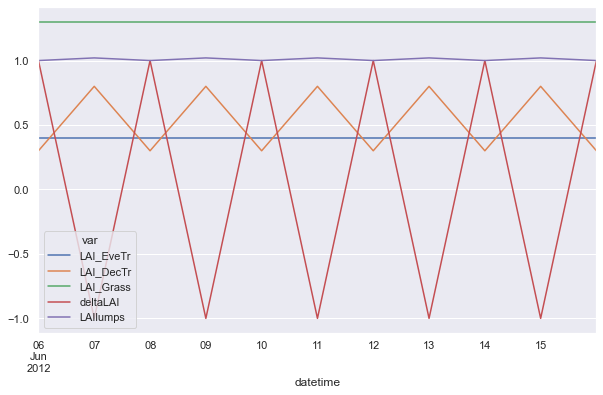

In [31]:
df_output_w.DailyState.loc[1].loc['2012 06 05': '2012 06 15'].filter(like="LAI").dropna().plot(figsize=(10,6))
#df_forcing_w.loc['2012','Tair'].resample('D').mean().plot(figsize=(10,6))

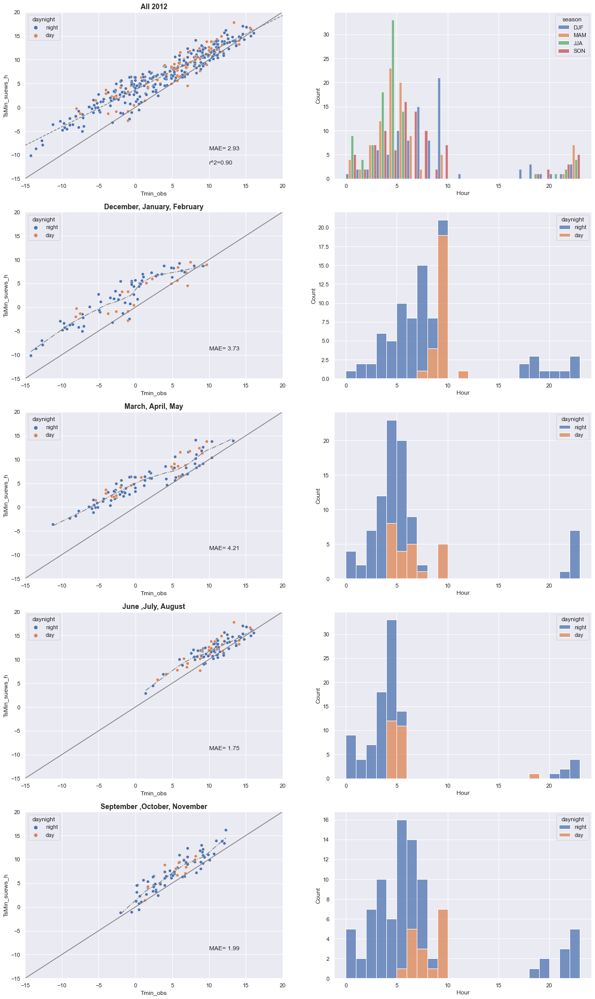

In [6]:
sns.set_theme()

merge_x = df_merge.loc['2012']

winter = merge_x[merge_x['season']=='DJF']
spring = merge_x[merge_x['season']=='MAM']
summer = merge_x[merge_x['season']=='JJA']
autumn = merge_x[merge_x['season']=='SON']

x = 'Tmin_obs'
y = 'TsMin_suews_h'
fig, axes = plt.subplots(5, 2, figsize=(20,35))

huesc = 'daynight'
huehist = 'daynight'
fract = 1./3
cmap = 'deep'

data = merge_x.copy()
mae = data[data['Tmin_obs'].notna()]
ax1 = sns.scatterplot(ax = axes[0,0],data=data, x=x ,y=y , hue = huesc , palette=cmap, hue_order=['night','day'])
ax1.set_title('All 2012', fontsize =14, fontweight ='bold')
ax1.annotate('r^2='+str(r2(data,y)),xy=(10, -12))
ax1.annotate('MAE= '+str(round(mean_absolute_error(mae[x], mae[y]), 2)),xy=(10, -9))
ax1.axline((0, intercept(data,y)), slope=slope(data,y),linestyle ='--',color ='grey')
sns.histplot(ax=axes[0, 1], data = data, x ='Hour', binwidth = 1, hue= 'season',multiple='dodge')

data = winter
mae = data[data['Tmin_obs'].notna()]
ax2 = sns.scatterplot(ax = axes[1,0],data=data, x=x ,y=y , hue= huesc, palette=cmap, hue_order=['night','day'])
sm_x, sm_y = sm_lowess(data[y], data[x],  frac=fract,it=1, return_sorted = True).T
ax2.plot(sm_x, sm_y, color='gray',linestyle ='-.')
ax2.annotate('MAE= '+str(round(mean_absolute_error(mae[x], mae[y]), 2)),xy=(10, -9))
ax2.set_title('All Year 2012', fontsize =14, fontweight ='bold')
ax2.set_title('December, January, February', fontsize =14, fontweight ='bold')
sns.histplot(ax=axes[1, 1], data = data, x ='Hour', binwidth = 1, hue = huehist,multiple="stack", hue_order=['night','day'])

data = spring
mae = data[data['Tmin_obs'].notna()]
ax3 = sns.scatterplot(ax = axes[2,0],data=data, x=x ,y=y , hue= huesc, palette=cmap, hue_order=['night','day'])
sm_x, sm_y = sm_lowess(data[y], data[x],  frac=fract,it=1, return_sorted = True).T
ax3.annotate('MAE= '+str(round(mean_absolute_error(mae[x], mae[y]), 2)),xy=(10, -9))
ax3.plot(sm_x, sm_y, color='gray',linestyle ='-.')
ax3.set_title('March, April, May', fontsize =14, fontweight ='bold')
sns.histplot(ax=axes[2, 1], data = data, x ='Hour', binwidth = 1, hue = huehist,multiple="stack", hue_order=['night','day'])

data = summer
mae = data[data['Tmin_obs'].notna()]
ax4 = sns.scatterplot(ax = axes[3,0],data=data, x=x ,y=y , hue=huesc, palette=cmap)
sm_x, sm_y = sm_lowess(data[y], data[x],  frac=fract,it=1, return_sorted = True).T
ax4.annotate('MAE= '+str(round(mean_absolute_error(mae[x], mae[y]), 2)),xy=(10, -9))
ax4.plot(sm_x, sm_y, color='gray',linestyle ='-.')
ax4.set_title('June ,July, August', fontsize =14, fontweight ='bold')
sns.histplot(ax=axes[3, 1], data = data, x ='Hour', binwidth = 1, hue = huehist,multiple="stack")

data = autumn
mae = data[data['Tmin_obs'].notna()]
ax5 = sns.scatterplot(ax = axes[4,0],data=data, x=x ,y=y , hue=  huesc, palette=cmap)
ax5.annotate('MAE= '+str(round(mean_absolute_error(mae[x], mae[y]), 2)),xy=(10, -9))
sm_x, sm_y = sm_lowess(data[y], data[x],  frac=fract,it=1, return_sorted = True).T
ax5.plot(sm_x, sm_y, color='grey',linestyle ='-.')
ax5.set_title('September ,October, November', fontsize =14, fontweight ='bold')
sns.histplot(ax=axes[4, 1], data = data, x ='Hour', binwidth = 1, hue = huehist ,multiple="stack")

for i in [ax1,ax2,ax3,ax4,ax5]:
    i.axline((1, 1), slope=1,linestyle ='-',color ='grey')
    i.set_xlim([-15, 20])
    i.set_ylim([-15, 20])


# Which months has highest absolute deviations from observations?
## Spring months , March, april, may

In [7]:
df_merge.reset_index().set_index('time')['diff_abs_h'].hvplot.kde(by='index.month',legend='top', height=400)


:NdOverlay   [index.month]
   :Distribution   [diff_abs_h]   (Density)

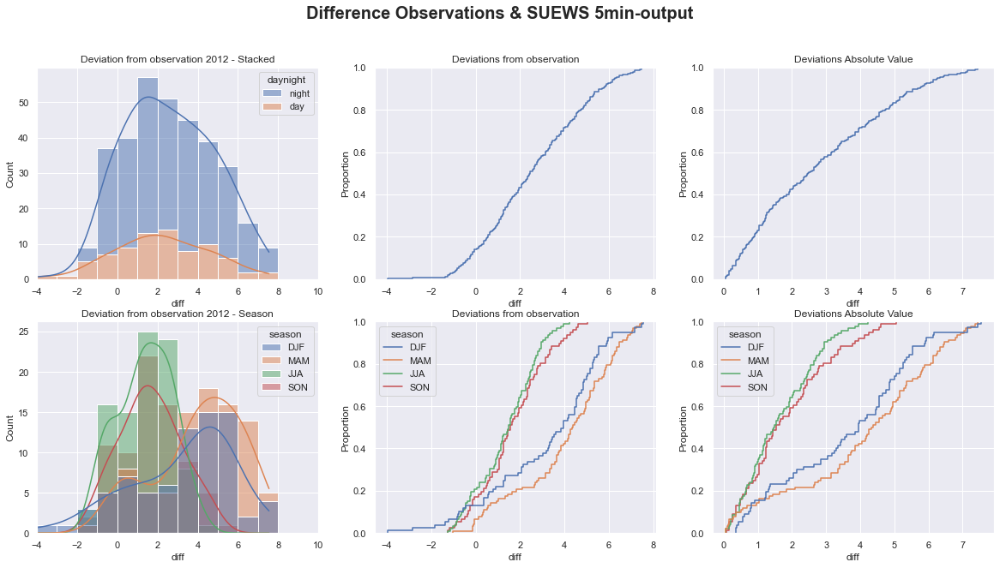

In [8]:
sns.set_theme()

data = df_merge.loc['2012']

var = 'diff'
fig, axes = plt.subplots(2, 3, figsize = (20,10))
fig.suptitle('Difference Observations & SUEWS 5min-output', fontsize=20, fontweight='bold')
ax1=sns.histplot(data, x =var, ax = axes[0,0], kde=True, bins =range(-4, 10, 1), hue='daynight',multiple='stack',hue_order=['night','day'])
ax1.set_xlim(-4,10)
ax1.set_title('Deviation from observation 2012 - Stacked')
ax2=sns.ecdfplot(data, x = var, ax = axes[0,1]).set(title='Deviations from observation')
ax3=sns.ecdfplot(data, x =data[var].abs(), ax = axes[0,2]).set(title='Deviations Absolute Value')

ax4=sns.histplot(data, x =var, hue="season", ax = axes[1,0], kde=True, bins = range(-4, 10, 1))
ax4.set_xlim(-4,10)
ax4.set_title('Deviation from observation 2012 - Season')
ax5=sns.ecdfplot(data, x =data[var] , hue='season',ax = axes[1,1]).set(title='Deviations from observation')
ax6=sns.ecdfplot(data, x =data[var].abs(), ax = axes[1,2], hue='season').set(title='Deviations Absolute Value')



In [9]:
print(df_merge[['diff','diff_abs']].describe().to_markdown(),'\n*********************************************************************************************\n*********************************************************************************************\n\t\t\t\t     Deviations')
print((df_merge['diff'].groupby(df_merge['season']).describe().to_markdown()),'\n*********************************************************************************************')
print('*********************************************************************************************\n\t\t\t       Deviations Absolute Values')
print(df_merge['diff'].abs().groupby(df_merge['season']).describe().to_markdown())
print('*********************************************************************************************')


|       |      diff |    diff_abs |
|:------|----------:|------------:|
| count | 688       | 688         |
| mean  |   3.18289 |   3.33253   |
| std   |   2.34992 |   2.13207   |
| min   |  -6.12216 |   0.0334229 |
| 25%   |   1.43524 |   1.4865    |
| 50%   |   3.08698 |   3.14575   |
| 75%   |   4.94123 |   4.94575   |
| max   |   9.04575 |   9.04575   | 
*********************************************************************************************
*********************************************************************************************
				     Deviations
| season   |   count |    mean |     std |      min |      25% |     50% |     75% |     max |
|:---------|--------:|--------:|--------:|---------:|---------:|--------:|--------:|--------:|
| DJF      |     162 | 3.47609 | 2.46622 | -3.96383 | 1.74649  | 3.84575 | 5.14575 | 8.84575 |
| JJA      |     179 | 2.23209 | 1.79641 | -1.27189 | 0.941561 | 2.0577  | 3.44575 | 7.39601 |
| MAM      |     184 | 4.64719 | 2.32506 | -2.14353

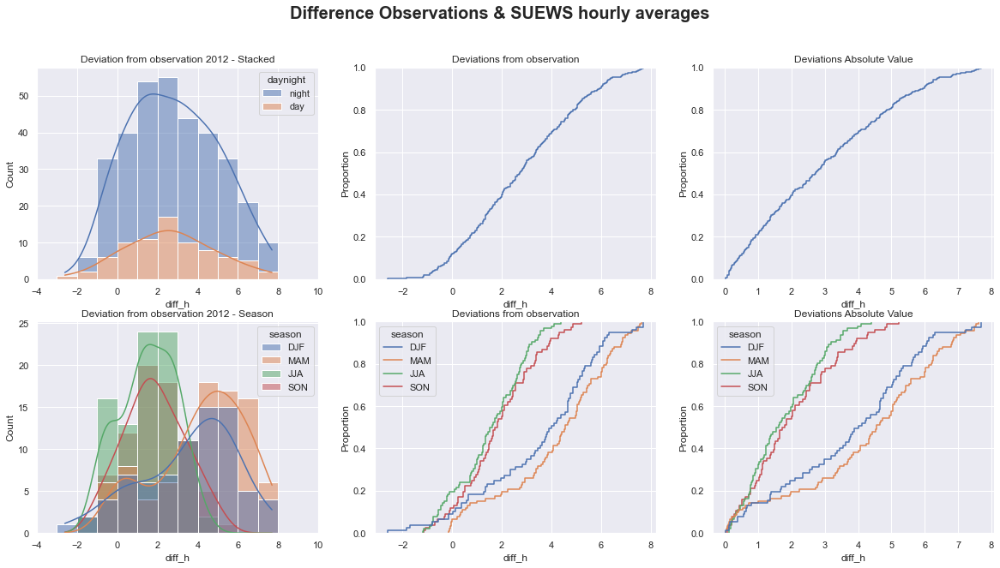

In [10]:
data = df_merge.loc['2012']

var = 'diff_h'
fig, axes = plt.subplots(2, 3, figsize = (20,10))
fig.suptitle('Difference Observations & SUEWS hourly averages', fontsize=20, fontweight='bold')
ax1=sns.histplot(data, x =var, ax = axes[0,0], kde=True, bins =range(-4, 10, 1), hue='daynight',multiple='stack',hue_order=['night','day'])
ax1.set_xlim(-4,10)
ax1.set_title('Deviation from observation 2012 - Stacked')
ax2=sns.ecdfplot(data, x = var, ax = axes[0,1]).set(title='Deviations from observation')
ax3=sns.ecdfplot(data, x =data[var].abs(), ax = axes[0,2]).set(title='Deviations Absolute Value')

ax4=sns.histplot(data, x =var, hue="season", ax = axes[1,0], kde=True, bins = range(-4, 10, 1))
ax4.set_xlim(-4,10)
ax4.set_title('Deviation from observation 2012 - Season')
ax5=sns.ecdfplot(data, x =data[var] , hue='season',ax = axes[1,1]).set(title='Deviations from observation')
ax6=sns.ecdfplot(data, x =data[var].abs(), ax = axes[1,2], hue='season').set(title='Deviations Absolute Value')

In [11]:
print(df_merge[['diff_h','diff_abs_h']].describe().to_markdown(),'\n*********************************************************************************************\n*********************************************************************************************\n\t\t\t\t     Deviations')
print((df_merge['diff_h'].groupby(df_merge['season']).describe().to_markdown()),'\n*********************************************************************************************')
print('*********************************************************************************************\n\t\t\t       Deviations Absolute Values')
print(df_merge['diff_h'].abs().groupby(df_merge['season']).describe().to_markdown())
print('*********************************************************************************************')


|       |    diff_h |   diff_abs_h |
|:------|----------:|-------------:|
| count | 688       |   688        |
| mean  |   3.37796 |     3.47806  |
| std   |   2.33347 |     2.18123  |
| min   |  -5.09164 |     0.004043 |
| 25%   |   1.61459 |     1.63773  |
| 50%   |   3.28203 |     3.29678  |
| 75%   |   5.09163 |     5.09168  |
| max   |   9.27492 |     9.27492  | 
*********************************************************************************************
*********************************************************************************************
				     Deviations
| season   |   count |    mean |     std |      min |     25% |     50% |     75% |     max |
|:---------|--------:|--------:|--------:|---------:|--------:|--------:|--------:|--------:|
| DJF      |     162 | 3.75781 | 2.3715  | -2.81196 | 2.10007 | 4.0416  | 5.25617 | 9.27492 |
| JJA      |     179 | 2.37987 | 1.8334  | -1.1672  | 1.03342 | 2.26437 | 3.61839 | 7.51766 |
| MAM      |     184 | 4.81804 | 2.30901 | -0

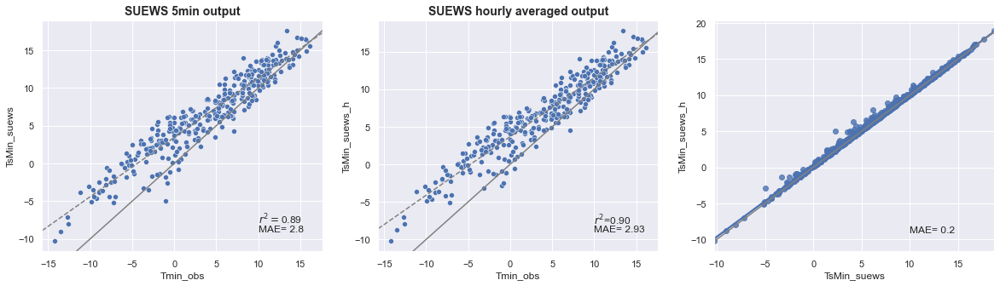

In [12]:
fig, axes = plt.subplots(1, 3, figsize = (20,5))
data = df_obs_m.loc['2012']
mae = data[data['Tmin_obs'].notna()]
x='Tmin_obs'
y= 'TsMin_suews'
ax1=sns.scatterplot(ax = axes[0],data=data,x= x,y=y)
ax1.annotate('$r^2=$'+str(r2(data,y)),xy=(10, -8))
ax1.annotate('MAE= '+str(round(mean_absolute_error(mae[x], mae[y]), 2)),xy=(10, -9))
ax1.axline((0, intercept(data,y)), slope=slope(data,y),linestyle ='--',color ='grey')
ax1.axline((1, 1), slope=1,linestyle ='-',color ='grey')
ax1.set_title('SUEWS 5min output', fontsize =14, fontweight ='bold')

y= 'TsMin_suews_h'
ax2=sns.scatterplot(ax = axes[1],data=data,x= x,y=y)
ax2.annotate('$r^2$='+str(r2(data,y)),xy=(10, -8))
ax2.annotate('MAE= '+str(round(mean_absolute_error(mae[x], mae[y]),2)),xy=(10, -9))
ax2.axline((0, intercept(data,y)), slope=slope(data,y),linestyle ='--',color ='grey')
ax2.axline((1, 1), slope=1,linestyle ='-',color ='grey')
ax2.set_title('SUEWS hourly averaged output', fontsize =14, fontweight ='bold')

ax3 = sns.regplot(data= df_obs_m, x='TsMin_suews',y='TsMin_suews_h',ax = axes[2])
ax3.annotate('MAE= '+str(round(mean_absolute_error(mae['TsMin_suews_h'], mae['TsMin_suews']),2)),xy=(10, -9))
ax3.axline((1, 1), slope=1,linestyle ='-',color ='grey')



# 



In [13]:
data = df_merge.loc['2012']
data.hvplot.line(x='time', y=['TsMin_suews_h','Tmin_obs'],alpha = 0.5, 
                value_label='Min Grass Temp', legend='top', height=500, width=1000) * data.hvplot.scatter(x='time', y=['TsMin_suews_h','Tmin_obs'],alpha=0.7) * hv.HLine(0).opts(color='grey', line_dash='dashed',alpha=0.4, line_width = 0.7) * df_forcing_w.loc['2012','Tair'].drop(columns=('daynight')).hvplot.line(alpha=0.5, line_width = 0.8) * df_suews.loc['2012','Tsurf'].drop(columns=('daynight')).hvplot.line(alpha=0.5, line_width = 0.8)

        

:Overlay
   .NdOverlay.I  :NdOverlay   [Variable]
      :Curve   [time]   (Min Grass Temp)
   .NdOverlay.II :NdOverlay   [Variable]
      :Scatter   [time]   (value)
   .HLine.I      :HLine   [x,y]
   .Curve.Tair   :Curve   [index]   (Tair)
   .Curve.Tsurf  :Curve   [datetime]   (Tsurf)